In [2]:
from script import dataLoader
import os
import cv2 
folder_path = os.path.dirname("./data/")

dl = dataLoader(folder_path)


In [3]:
print(len(dl.groups))

151


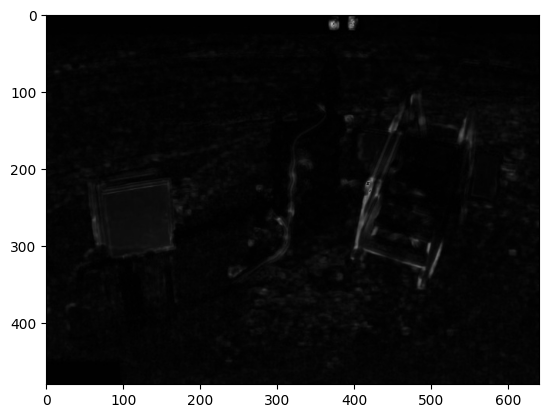

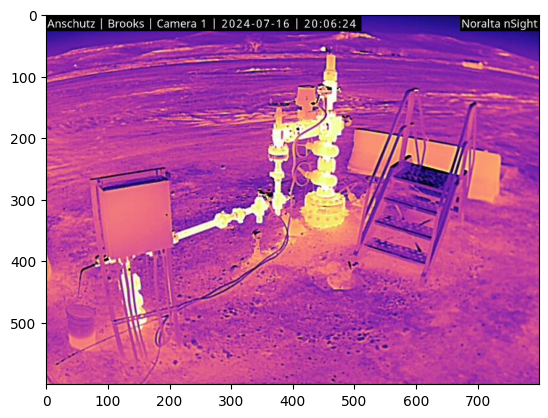

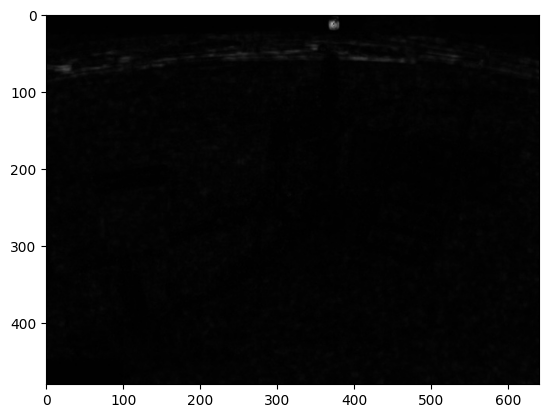

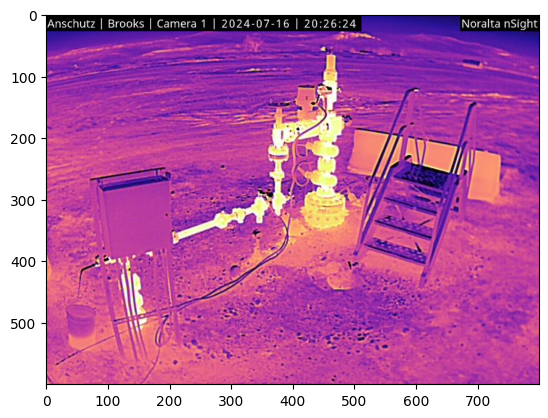

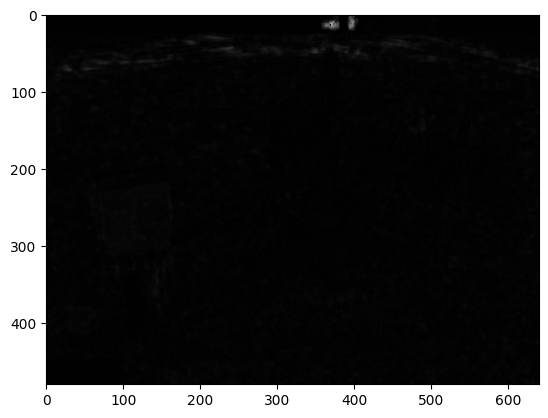

...

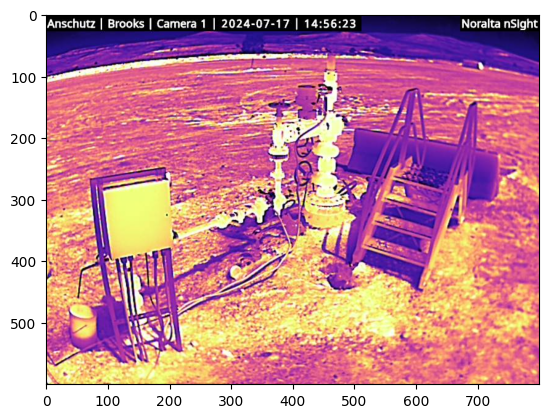

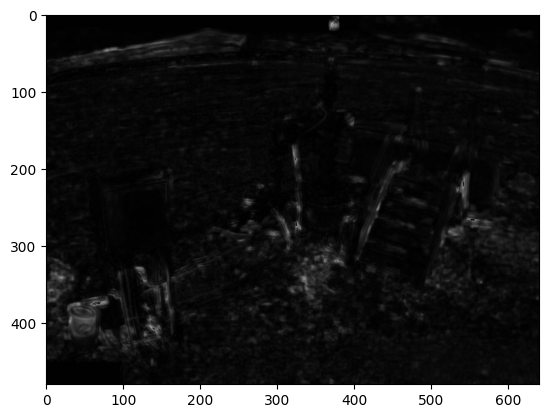

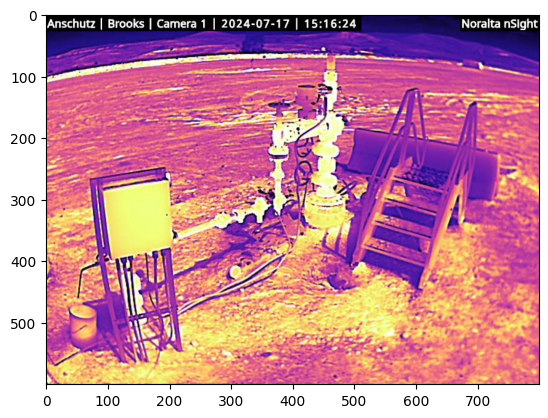

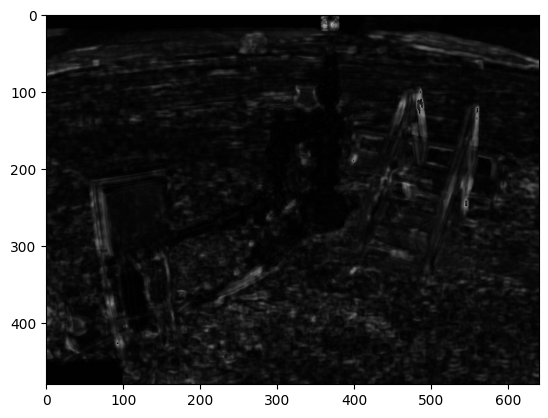

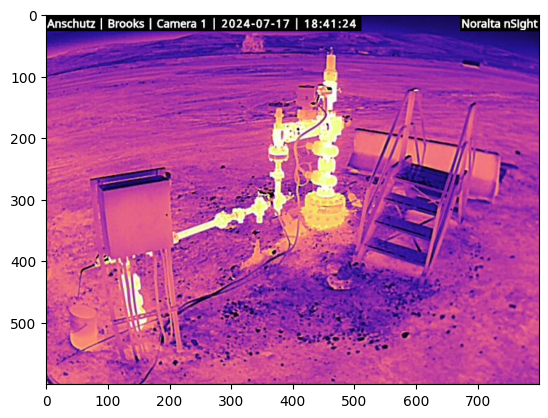

In [4]:
import matplotlib.pyplot as plt
count = 0
for img_name in dl.groups[0]['entries']:
    img_path = os.path.join("./data/diff_maps/", img_name+'.jpg')
    image = cv2.imread(img_path)
    imgplot = plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    img_path = os.path.join("./data/images/", img_name+'.jpg')
    image = cv2.imread(img_path)
    imgplot = plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    count += 1


In [24]:
def load_bounding_boxes(txt_file_path):
    bounding_boxes = []
    # Open the text file and read each line
    with open(txt_file_path, 'r') as file:
        for line in file:
            # Split each line by spaces and convert to float
            data = line.strip().split()
            if len(data) != 5:
                continue  # Skip lines that do not have exactly 5 values
            class_id = int(data[0])  # Convert class ID to integer
            x_center = float(data[1])
            y_center = float(data[2])
            width = float(data[3])
            height = float(data[4])

            # Append the bounding box as a tuple to the list
            bounding_boxes.append((class_id, x_center, y_center, width, height))
    
    return bounding_boxes

def draw_bounding_box(image, bbox, color=(0, 255, 0), thickness=2):
    """
    Draws a bounding box on an image using relative coordinates.

    Parameters:
    - image: The image on which to draw.
    - bbox: Tuple (x_center_rel, y_center_rel, width_rel, height_rel) with relative values.
    - color: Tuple for box color in BGR format.
    - thickness: Line thickness of the bounding box.
    """
    height, width = image.shape[:2]
    for b in bbox:
        # Extract relative coordinates
        cls, x_center_rel, y_center_rel, width_rel, height_rel = b
        
        # Convert relative coordinates to absolute pixel values
        x_center = int(x_center_rel * width)
        y_center = int(y_center_rel * height)
        box_width = int(width_rel * width)
        box_height = int(height_rel * height)
    
        # Calculate the top-left and bottom-right corner points
        top_left = (x_center - box_width // 2, y_center - box_height // 2)
        bottom_right = (x_center + box_width // 2, y_center + box_height // 2)
        
        # Draw the bounding box
        cv2.rectangle(image, top_left, bottom_right, color, thickness)


035-50-01-0069-01-3-2024-07-17 13-35-22.309955


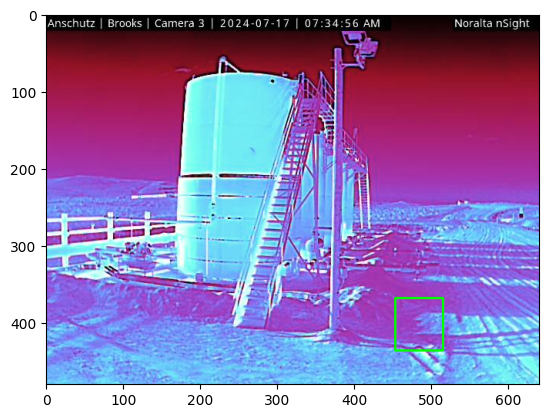

035-50-01-0069-01-3-2024-07-17 14-15-22.435034


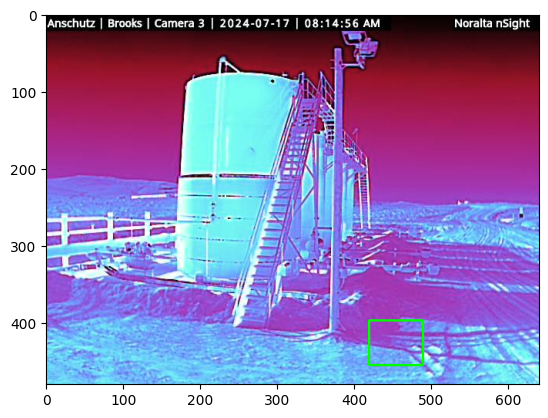

035-50-01-0069-01-3-2024-07-17 14-40-22.513126


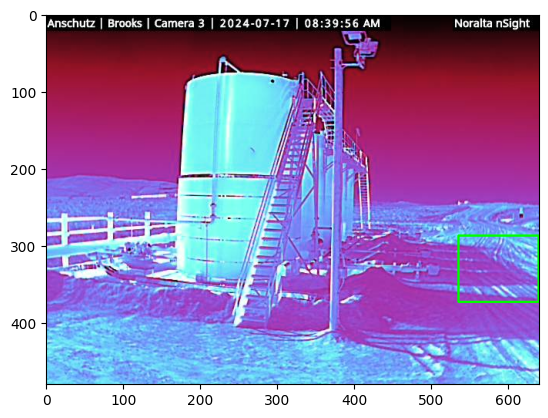

035-50-01-0069-01-3-2024-07-17 15-15-22.638089


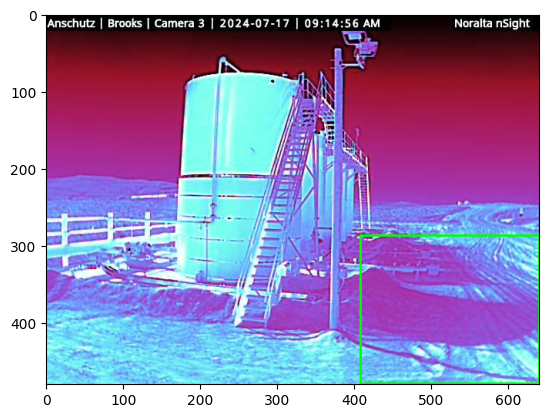

035-50-01-0069-01-3-2024-07-17 15-25-22.653784


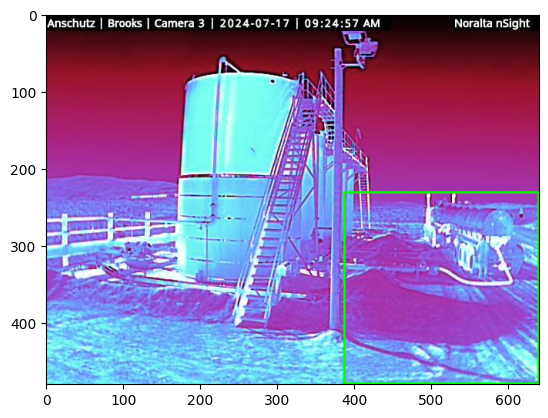

035-50-01-0069-01-3-2024-07-17 17-35-22.903721


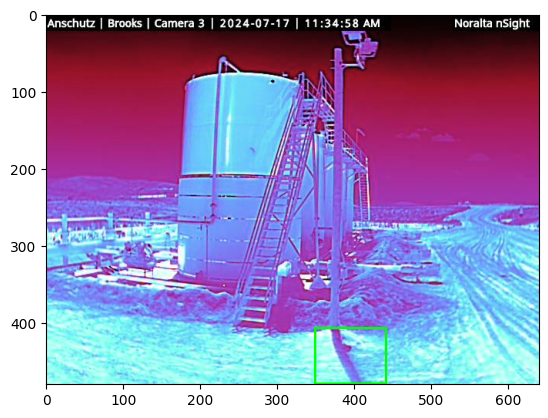

035-50-01-0069-01-3-2024-07-17 17-40-22.919382


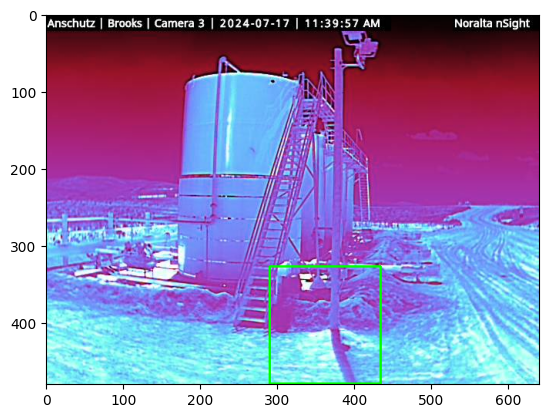

In [49]:
#print(dl.groups[0]['entries'])
for img_name in dl.groups[2]['entries']:
    print(img_name)
    img_path = os.path.join("./data/images/", img_name+'.jpg')
    image = cv2.imread(img_path)
    labels_path = os.path.join("./data/labels/", img_name+'.txt')
    labels = load_bounding_boxes(labels_path)
    draw_bounding_box(image, labels)
    imgplot = plt.imshow(image)
    plt.show()
    count += 1



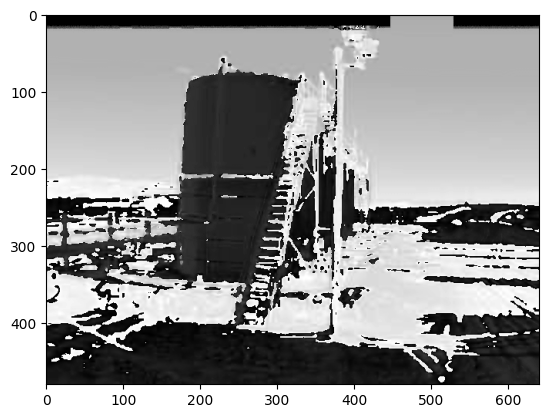

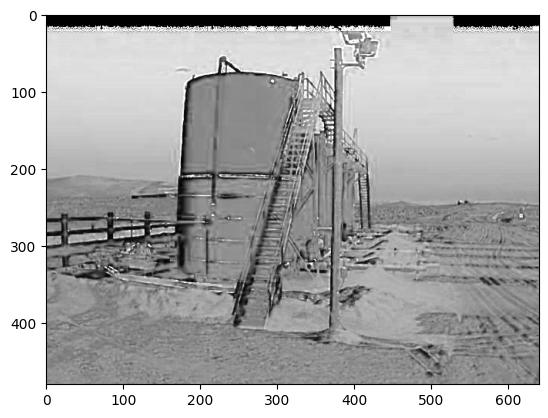

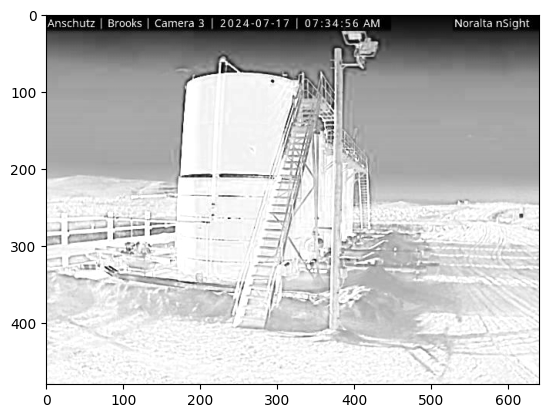

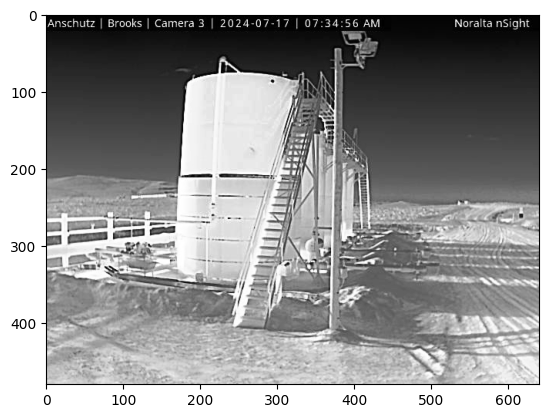

In [12]:
count = 0
for img_name in dl.groups[2]['entries']:
    img_path = os.path.join("./data/images/", img_name+'.jpg')
    image = cv2.imread(img_path)
    frame_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    frame_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hue_channel = frame_hsv[:, :, 0]
    imgplot = plt.imshow(frame_hsv[:, :, 0], cmap='gray', vmin=0, vmax=179)
    plt.show()
    imgplot = plt.imshow(frame_hsv[:, :, 1], cmap='gray', vmin=0, vmax=255)
    plt.show()
    imgplot = plt.imshow(frame_hsv[:, :, 2], cmap='gray', vmin=0, vmax=255)
    plt.show()
    enhanced_image = cv2.equalizeHist(frame_gray)
    imgplot = plt.imshow(enhanced_image, cmap='gray', vmin=0, vmax=255)
    plt.show()
    break


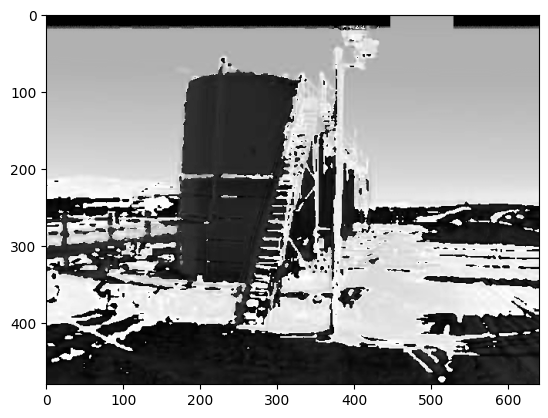

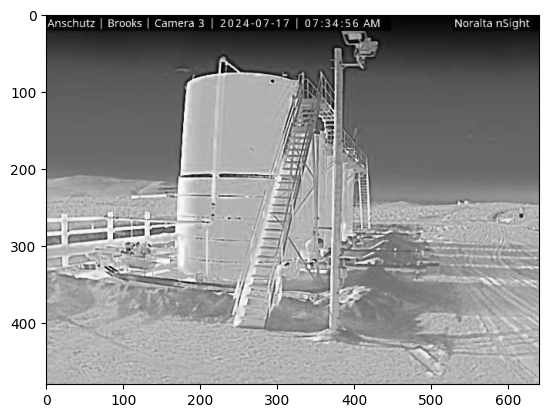

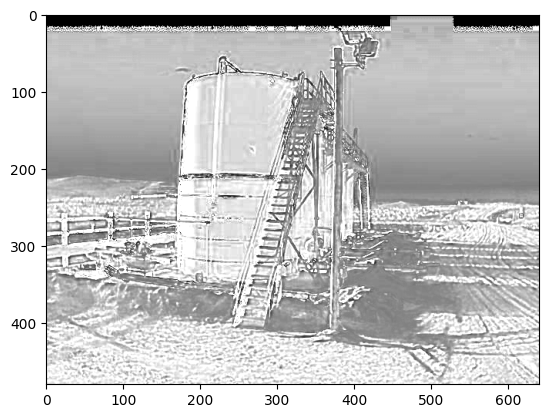

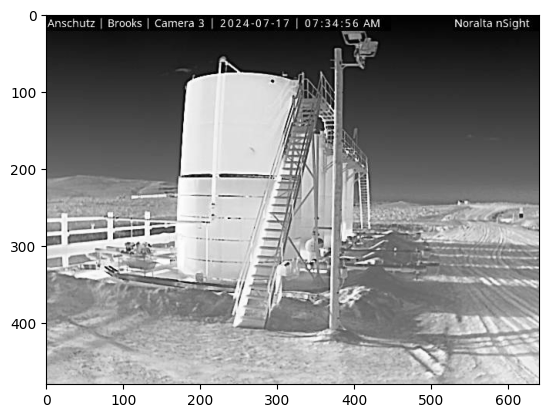

In [16]:
count = 0
for img_name in dl.groups[2]['entries']:
    img_path = os.path.join("./data/images/", img_name+'.jpg')
    image = cv2.imread(img_path)
    frame_hsl = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    imgplot = plt.imshow(frame_hsl[:, :, 0], cmap='gray', vmin=0, vmax=179)
    plt.show()
    imgplot = plt.imshow(frame_hsl[:, :, 1], cmap='gray', vmin=0, vmax=255)
    plt.show()
    imgplot = plt.imshow(frame_hsl[:, :, 2], cmap='gray', vmin=0, vmax=255)
    plt.show()
    enhanced_image = cv2.equalizeHist(frame_gray)
    imgplot = plt.imshow(enhanced_image, cmap='gray', vmin=0, vmax=255)
    plt.show()
    break


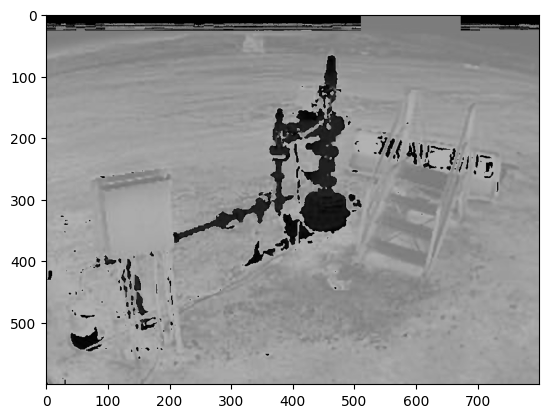

In [37]:
hue_channel = frame_hsv[:, :, 0]
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
fg_mask = cv2.erode(hue_channel, kernel, iterations=1)
fg_mask = cv2.dilate(fg_mask, kernel, iterations=2)
imgplot = plt.imshow(hue_channel, cmap='gray', vmin=0, vmax=255)
plt.show()